In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

In [2]:
# Set up paths
script_dir = os.getcwd()
root_dir = os.path.abspath(os.path.join(script_dir, os.pardir))
tableu_dir = os.path.join(root_dir, 'tableau')


In [3]:
def simple_line_plot(df, x, y, title, xlabel, ylabel):
    fig, ax = plt.subplots()
    df.plot(x=x, y=y, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.grid(True)
    plt.show()
    plt.close()
   
    return None

## Baseline Plots

In [4]:
baseline_df = pd.read_csv(os.path.join(tableu_dir, 'baseline_python_ver.csv'))
baseline_df.head()

,time,Resources,Economy,Bureaucracy,Pollution
0,0.00,1.000000,0.100000,0.010000,0.001000
1,0.01,0.999989,0.100011,0.010002,0.001010
2,0.02,0.999978,0.100023,0.010004,0.001019
3,0.03,0.999966,0.100034,0.010007,0.001029
4,0.04,0.999955,0.100045,0.010009,0.001038


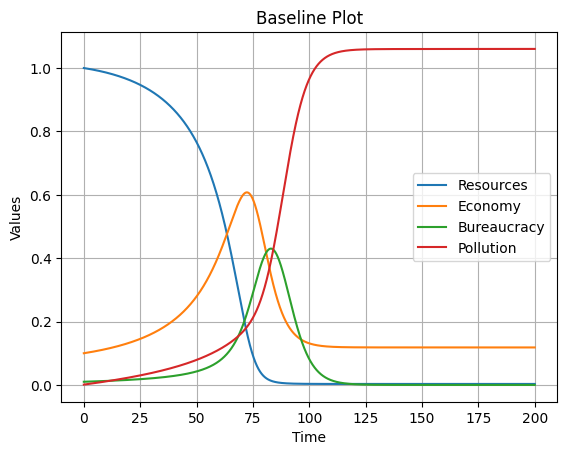

In [5]:
state_variables = ['Resources', 'Economy', 'Bureaucracy', 'Pollution']
flow_variables = ['inflow', 'outflow']

# Plot the data
simple_line_plot(baseline_df, 'time', state_variables, 'Baseline Plot', 'Time', 'Values')

## Bardi Ensamble

In [9]:
output_df = pd.read_csv(os.path.join(tableu_dir, 'bardis_ensemble_python_ver_100.csv'))
output_df.head()

,Resources,Economy,Bureaucracy,Pollution,time,run_id
0,1.000000,0.100000,0.010000,0.001000,0.0,1.0
1,0.999951,0.100172,0.010046,0.001101,0.2,1.0
2,0.999901,0.100345,0.010093,0.001203,0.4,1.0
3,0.999849,0.100519,0.010140,0.001304,0.6,1.0
4,0.999796,0.100694,0.010187,0.001406,0.8,1.0


In [10]:
output_df

,Resources,Economy,Bureaucracy,Pollution,time,run_id
0,1.000000,0.100000,1.000000e-02,0.001000,0.0,1.0
1,0.999951,0.100172,1.004647e-02,0.001101,0.2,1.0
2,0.999901,0.100345,1.009319e-02,0.001203,0.4,1.0
3,0.999849,0.100519,1.014014e-02,0.001304,0.6,1.0
4,0.999796,0.100694,1.018734e-02,0.001406,0.8,1.0
...,...,...,...,...,...,...
100095,0.000209,0.020162,9.452395e-07,1.143534,199.2,100.0
100096,0.000209,0.020162,9.224389e-07,1.143534,199.4,100.0
100097,0.000209,0.020162,9.001884e-07,1.143534,199.6,100.0
100098,0.000209,0.020162,8.784745e-07,1.143534,199.8,100.0


In [11]:
# Load experiment data
exp_design_df = pd.read_csv(os.path.join(tableu_dir, 'exp_design_python_ver_100.csv'))
exp_design_df.head()

,k_resources:X,ef_economy_resources_on_prod:X,ef_bureaucracy_on_prod:X,k_deprec:X,ef_pollution_on_depreciation:X,k_bureaucracy:X,ef_economy_on_bureaucracy:X,k_decay_bureaucracy:X,ef_pollution_on_bureaucracy:X,k_pollution:X,k_pollution_decay:X,run_id
0,1.129034,0.802748,0.951673,0.771246,1.054154,1.150654,1.047367,1.404866,1.017729,0.523315,1.092041,1
1,0.607121,1.378729,0.851854,1.340985,1.165829,0.576498,0.797978,0.681097,1.102719,1.238542,0.707632,2
2,0.991201,0.790979,1.021124,0.933654,1.324236,1.435745,0.988815,0.885192,0.901653,1.116684,0.890304,3
3,0.773981,1.488040,0.663542,1.373196,0.943706,0.886828,0.528715,1.390652,0.706519,1.182834,0.562873,4
4,1.111947,1.203423,1.449691,0.995553,0.898652,0.605292,0.632564,1.147411,1.321983,0.705844,1.409353,5


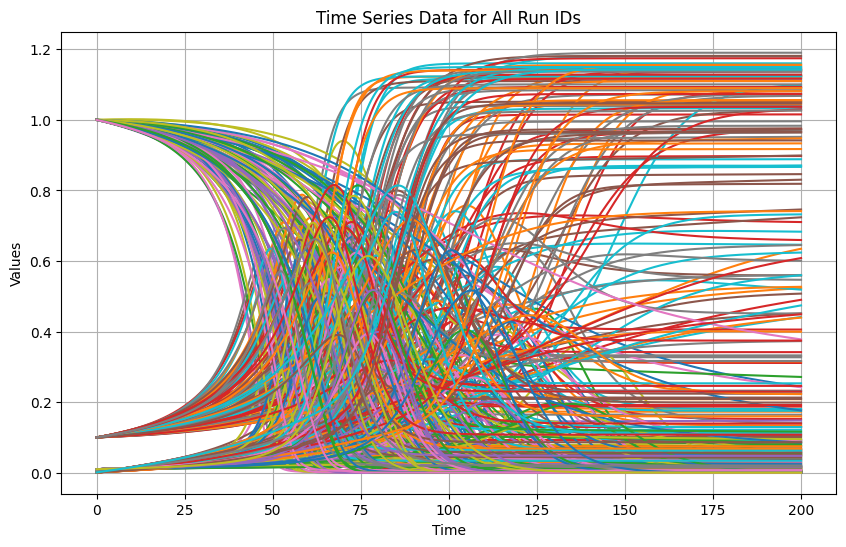

In [12]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the columns to plot
columns_to_plot = ['Resources', 'Economy', 'Bureaucracy', 'Pollution']

# Loop through each unique 'run_id'
for run_id in output_df['run_id'].unique():
    subset = output_df[output_df['run_id'] == run_id]
    for column in columns_to_plot:
        ax.plot(subset['time'], subset[column], label=f'{column} Run ID {run_id}')

# Adding plot title and labels
ax.set_title('Time Series Data for All Run IDs')
ax.set_xlabel('Time')
ax.set_ylabel('Values')
ax.grid(True)

# Show the plot
plt.show()

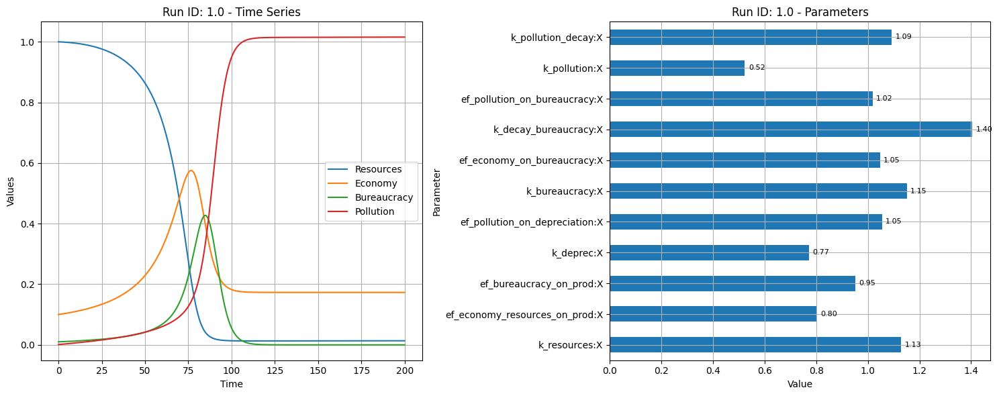

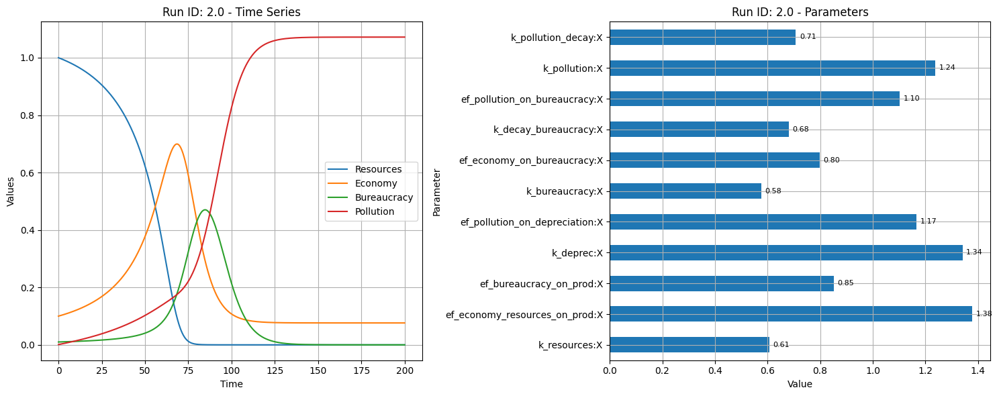

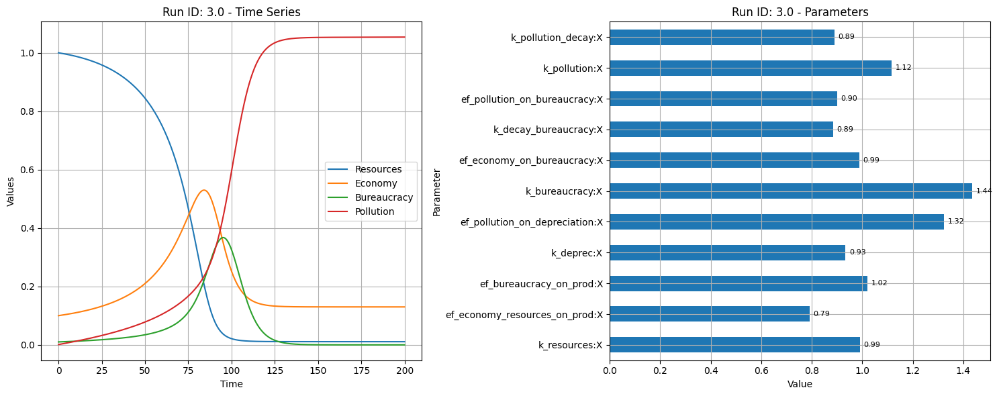

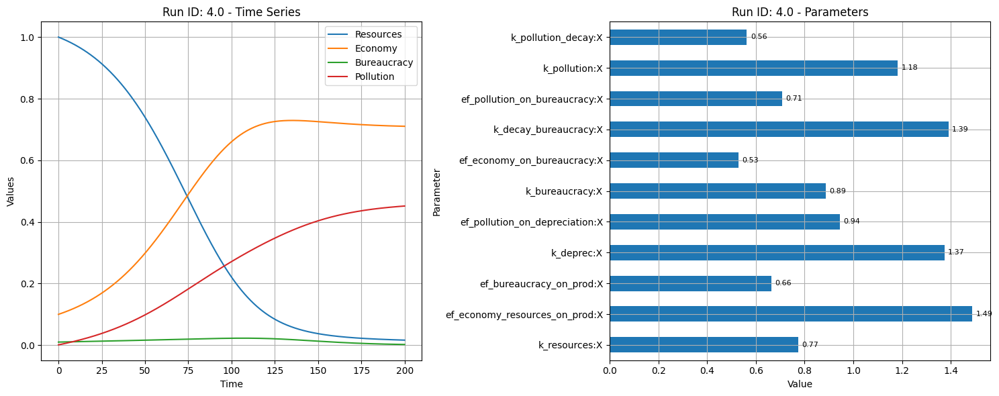

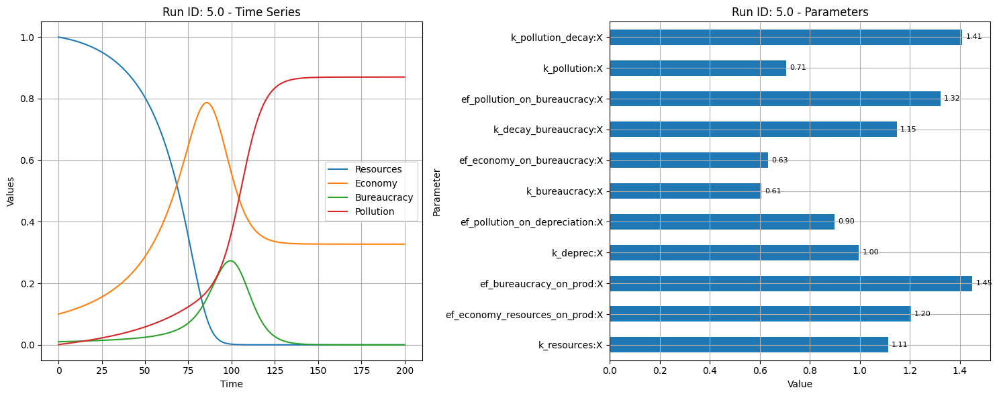

...

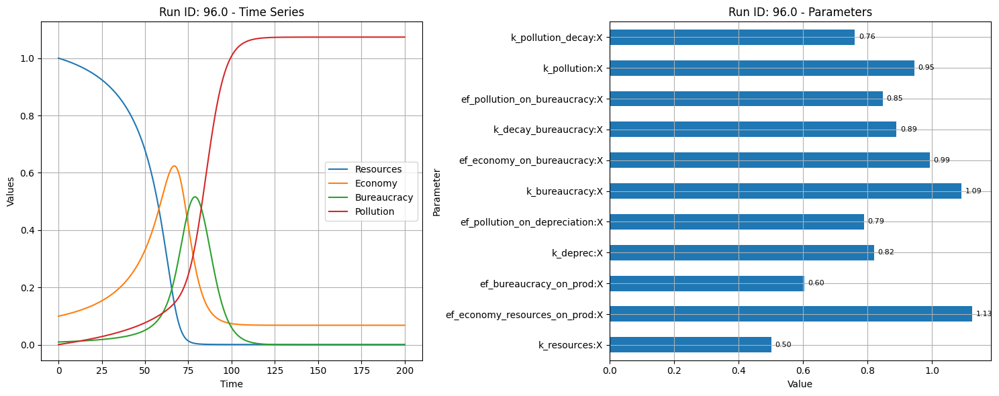

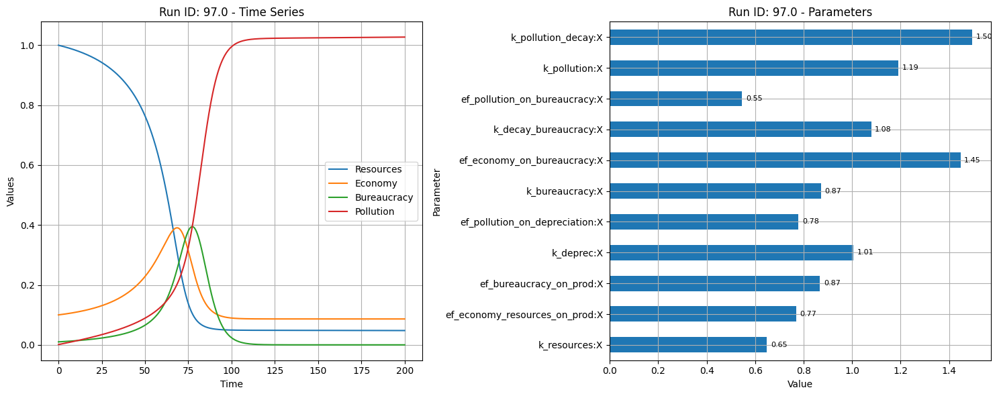

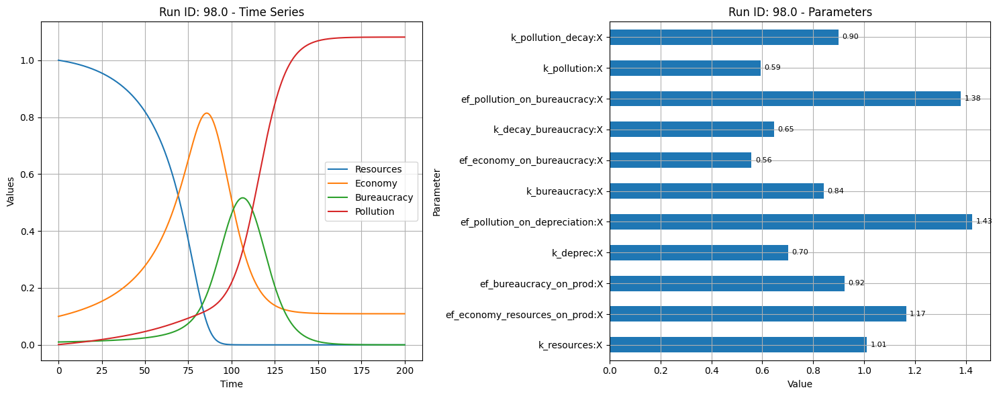

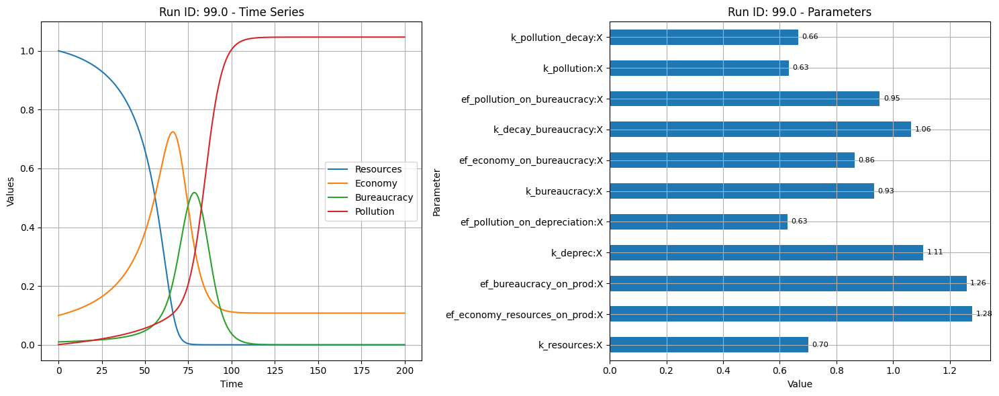

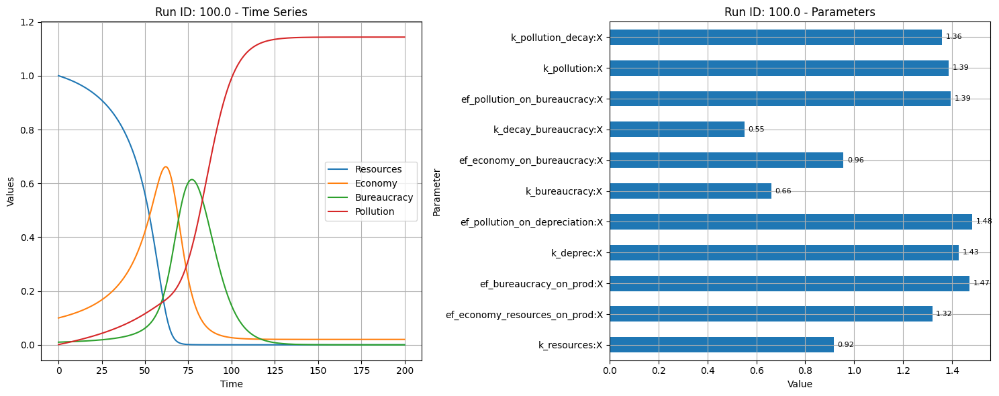

In [13]:
# Define the columns you want to plot.
parameters_to_plot = [
    'k_resources:X', 'ef_economy_resources_on_prod:X', 'ef_bureaucracy_on_prod:X',
    'k_deprec:X', 'ef_pollution_on_depreciation:X', 'k_bureaucracy:X',
    'ef_economy_on_bureaucracy:X', 'k_decay_bureaucracy:X', 'ef_pollution_on_bureaucracy:X',
    'k_pollution:X', 'k_pollution_decay:X'
]

stocks_to_plot = ['Resources', 'Economy', 'Bureaucracy', 'Pollution']

# Loop over each run_id and create one figure with two subplots.
for run_id in output_df['run_id'].unique():
    subset_output = output_df[output_df['run_id'] == run_id]
    subset_exp_design = exp_design_df[exp_design_df['run_id'] == run_id]
    
    # Create a figure with 1 row and 2 columns of subplots.
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Time series plot on the left subplot.
    subset_output.plot(x='time', y=stocks_to_plot, ax=ax1, title=f'Run ID: {run_id} - Time Series')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Values')
    ax1.legend()
    ax1.grid(True)
    
    # Horizontal bar plot on the right subplot.
    # Use the first row of exp_design data for this run_id.
    data_bar = subset_exp_design[parameters_to_plot].iloc[0]
    data_bar.plot(kind='barh', ax=ax2, title=f'Run ID: {run_id} - Parameters')
    ax2.set_xlabel('Value')
    ax2.set_ylabel('Parameter')
    ax2.grid(True)
    
    # Add labels to each bar with the actual value.
    # Compute an offset relative to the maximum value so the text doesn't overlap the bar.
    offset = data_bar.max() * 0.01  
    for patch in ax2.patches:
        ax2.text(patch.get_width() + offset, 
                 patch.get_y() + patch.get_height() / 2,
                 f'{patch.get_width():.2f}', 
                 ha='left', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()


In [22]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[output_df['run_id'] == run_id]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()


In [23]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[(output_df['run_id'] == run_id) & (output_df['time'] < 10)]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
